In [246]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import sklearn as sklearn

In [247]:
airline=pd.read_csv('EastWestAirlines.csv')
airline

,ID#,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award?
0,1,28143,0,1,1,1,174,1,0,0,7000,0
1,2,19244,0,1,1,1,215,2,0,0,6968,0
2,3,41354,0,1,1,1,4123,4,0,0,7034,0
3,4,14776,0,1,1,1,500,1,0,0,6952,0
4,5,97752,0,4,1,1,43300,26,2077,4,6935,1
5,6,16420,0,1,1,1,0,0,0,0,6942,0
6,7,84914,0,3,1,1,27482,25,0,0,6994,0
7,8,20856,0,1,1,1,5250,4,250,1,6938,1
8,9,443003,0,3,2,1,1753,43,3850,12,6948,1
9,10,104860,0,3,1,1,28426,28,1150,3,6931,1


In [ ]:
# H Clustering

In [165]:
def norm_func(i):                #Normalization or can also use MinMaxscaler   
    x = (i-i.min())/(i.max()-i.min())        
    return (x)

In [167]:
df_norm = norm_func(airline.iloc[:,1:])
df_norm

,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award?
0,0.000000,0.00,0.0,0.00,0.000660,0.011628,0.000000,0.000000,0.843742,0.0
1,0.000000,0.00,0.0,0.00,0.000815,0.023256,0.000000,0.000000,0.839884,0.0
2,0.000000,0.00,0.0,0.00,0.015636,0.046512,0.000000,0.000000,0.847842,0.0
3,0.000000,0.00,0.0,0.00,0.001896,0.011628,0.000000,0.000000,0.837955,0.0
4,0.000000,0.75,0.0,0.00,0.164211,0.302326,0.067398,0.075472,0.835905,1.0
5,0.000000,0.00,0.0,0.00,0.000000,0.000000,0.000000,0.000000,0.836749,0.0
6,0.000000,0.50,0.0,0.00,0.104223,0.290698,0.000000,0.000000,0.843019,0.0
7,0.000000,0.00,0.0,0.00,0.019910,0.046512,0.008112,0.018868,0.836267,1.0
8,0.000000,0.50,0.5,0.00,0.006648,0.500000,0.124931,0.226415,0.837473,1.0
9,0.000000,0.50,0.0,0.00,0.107803,0.325581,0.037317,0.056604,0.835423,1.0


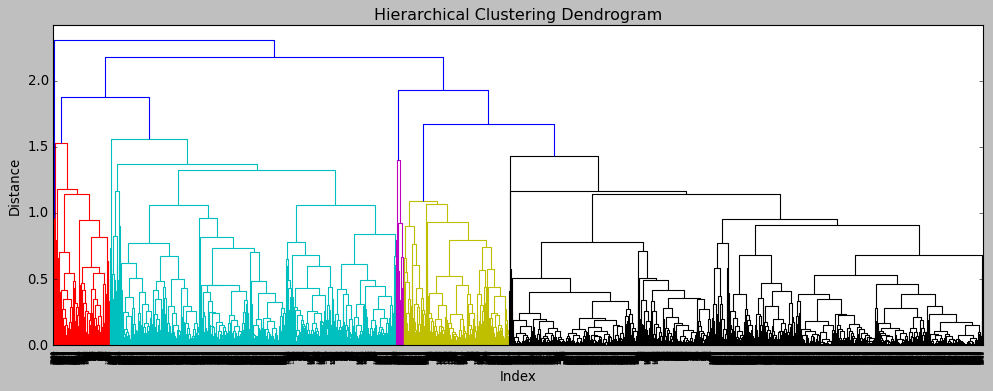

In [176]:
from scipy.cluster.hierarchy import linkage 
import scipy.cluster.hierarchy as sch # for creating dendrogram 
#p = np.array(df_norm) # converting into numpy array format 
z = linkage(df_norm, method="complete",metric="euclidean")
plt.figure(figsize=(15, 5))
plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel('Index')
plt.ylabel('Distance')
sch.dendrogram(
    z,
    #leaf_rotation=0.,  # rotates the x axis labels
    #leaf_font_size=8.,  # font size for the x axis labels
)
plt.show() 

In [178]:
from sklearn.cluster import AgglomerativeClustering 
h_complete = AgglomerativeClustering(n_clusters=12, linkage='complete',affinity = "euclidean").fit(df_norm) 

cluster_labels=pd.Series(h_complete.labels_)
cluster_labels
airline['clust']=cluster_labels # creating a  new column and assigning it to new column 
airline

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award?,clust
0,28143,0,1,1,1,174,1,0,0,7000,0,4
1,19244,0,1,1,1,215,2,0,0,6968,0,4
2,41354,0,1,1,1,4123,4,0,0,7034,0,4
3,14776,0,1,1,1,500,1,0,0,6952,0,4
4,97752,0,4,1,1,43300,26,2077,4,6935,1,5
5,16420,0,1,1,1,0,0,0,0,6942,0,4
6,84914,0,3,1,1,27482,25,0,0,6994,0,2
7,20856,0,1,1,1,5250,4,250,1,6938,1,5
8,443003,0,3,2,1,1753,43,3850,12,6948,1,5
9,104860,0,3,1,1,28426,28,1150,3,6931,1,5


In [179]:
airline.iloc[:,1:].groupby(airline.clust).mean()

,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award?,clust
clust,,,,,,,,,,,
0,221.892241,4.909483,1.000000,1.000000,79804.952586,24.387931,1283.340517,3.943966,5499.418103,1.0,0.0
1,2173.157895,1.078947,1.000000,1.000000,15538.210526,22.105263,5850.105263,16.736842,3510.289474,1.0,1.0
2,92.694505,3.793407,1.002198,1.030769,35849.443956,18.292308,268.872527,0.736264,4947.883516,0.0,2.0
3,0.000000,4.285714,1.000000,4.428571,124732.428571,30.857143,357.142857,1.000000,4897.857143,1.0,3.0
4,87.626228,1.248035,1.000000,1.000491,4431.667976,7.039784,217.935658,0.635069,3573.721513,0.0,4.0
5,161.071730,2.540084,1.010549,1.004219,22227.341772,15.274262,655.267932,2.139241,6404.263713,1.0,5.0
6,7049.777778,3.666667,1.000000,1.000000,31984.222222,17.333333,390.000000,1.333333,5133.555556,1.0,6.0
7,347.000000,2.500000,1.000000,1.000000,65634.250000,69.250000,19960.000000,49.250000,2200.250000,1.0,7.0
8,0.000000,1.000000,1.000000,4.500000,65932.500000,10.500000,0.000000,0.000000,2204.000000,0.0,8.0


In [180]:
data=airline[(airline.clust==1)]
data 

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award?,clust
420,529886,7210,1,1,1,23866,26,7741,15,8296,1,1
589,133445,8264,1,1,1,3375,13,0,0,6492,1,1
622,62080,2975,2,1,1,19113,32,10650,28,6434,1,1
833,114932,8559,1,1,1,3150,13,1650,12,6092,1,1
1187,123646,0,1,1,1,12450,30,2450,29,5069,1,1
1220,40965,10098,1,1,1,9850,11,1850,6,5429,1,1
1433,120152,0,1,1,1,6250,27,3750,26,4497,1,1
1476,190429,6168,1,1,1,27500,11,1500,3,4974,1,1
1489,266776,0,1,1,1,8370,30,6520,28,5042,1,1
1529,57857,1099,1,1,1,62650,37,12400,29,4996,1,1


In [ ]:
*******************************************************************************************************************************

In [ ]:
********************************************************************************************************************************

In [ ]:
# K Means clustering

In [181]:
from sklearn.cluster import KMeans

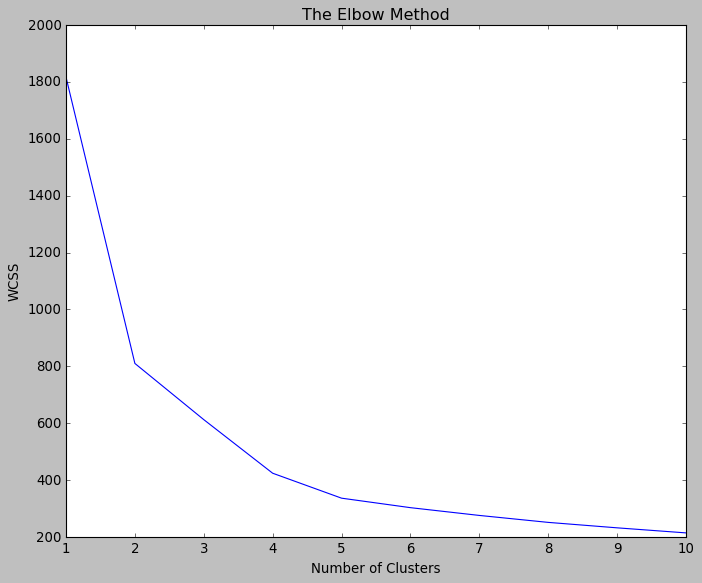

In [228]:
from sklearn.cluster import KMeans
fig = plt.figure(figsize=(10, 8))
WCSS = []
for i in range(1, 11):
    clf = KMeans(n_clusters=i,init='k-means++', random_state=2)
    clf.fit(df_norm)
    WCSS.append(clf.inertia_) # inertia is another name for WCSS

plt.plot(range(1, 11), WCSS)
plt.title('The Elbow Method')
plt.ylabel('WCSS')
plt.xlabel('Number of Clusters')
plt.show()

In [230]:
clf = KMeans(n_clusters=6, random_state=2)
y_kmeans = clf.fit_predict(df_norm)

In [239]:
clf.inertia_

303.1383749075098

In [231]:
y_kmeans

array([2, 2, 2, ..., 5, 0, 0])

In [232]:
clf.cluster_centers_

array([[ 8.44382696e-03,  1.76841085e-02,  8.23643411e-03,
         1.69573643e-03,  1.23045313e-02,  7.17842978e-02,
         6.90692719e-03,  1.13902296e-02,  2.39980966e-01,
         3.94129174e-15],
       [ 2.60542873e-02,  3.90044577e-02,  1.63447251e-02,
         2.22882615e-03,  3.35642727e-02,  1.21825219e-01,
         3.34267751e-02,  5.94073285e-02,  5.22892182e-01,
         1.00000000e+00],
       [ 8.06451613e-03,  3.05299539e-02,  9.79262673e-03,
         2.88018433e-04,  1.31485480e-02,  8.03906334e-02,
         7.91232441e-03,  1.37379358e-02,  6.71078504e-01,
         1.16573418e-15],
       [ 2.07175983e-02,  8.53887399e-01,  1.34048257e-03,
         1.34048257e-02,  2.36726228e-01,  2.58214353e-01,
         2.99537850e-02,  5.18994385e-02,  7.52607104e-01,
         1.00000000e+00],
       [ 6.59020789e-03,  6.46035599e-01,  8.09061489e-04,
         5.66343042e-03,  1.19022293e-01,  2.00383834e-01,
         7.27197078e-03,  1.18458814e-02,  5.32620376e-01,
        -4.

In [233]:
md=pd.Series(y_kmeans)  # converting numpy array into pandas series object 
airline['clust']=md # creating a  new column and assigning it to new column 
airline

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award?,clust
0,28143,0,1,1,1,174,1,0,0,7000,0,2
1,19244,0,1,1,1,215,2,0,0,6968,0,2
2,41354,0,1,1,1,4123,4,0,0,7034,0,2
3,14776,0,1,1,1,500,1,0,0,6952,0,2
4,97752,0,4,1,1,43300,26,2077,4,6935,1,3
5,16420,0,1,1,1,0,0,0,0,6942,0,2
6,84914,0,3,1,1,27482,25,0,0,6994,0,4
7,20856,0,1,1,1,5250,4,250,1,6938,1,1
8,443003,0,3,2,1,1753,43,3850,12,6948,1,3
9,104860,0,3,1,1,28426,28,1150,3,6931,1,3


In [234]:
airline.iloc[:,:].groupby(airline.clust).mean()

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award?
clust,,,,,,,,,,,
0,33097.301357,94.131783,1.070736,1.016473,1.006783,3244.520349,6.173450,212.850775,0.603682,1992.402132,0.0
1,83529.153046,290.453195,1.156018,1.032689,1.008915,8850.395245,10.476969,1030.112927,3.148588,4338.867756,1.0
2,49921.633641,89.903226,1.122120,1.019585,1.001152,3467.074885,6.913594,243.834101,0.728111,5567.925115,0.0
3,148946.713137,230.959786,4.415550,1.002681,1.053619,62421.155496,22.206434,923.085791,2.750670,6244.123324,1.0
4,118297.325243,73.467638,3.584142,1.001618,1.022654,31384.393204,17.233010,224.100324,0.627832,4419.553398,0.0
5,73478.908046,170.363218,3.487356,1.000000,1.002299,31194.280460,18.482759,534.211494,1.620690,3679.542529,1.0


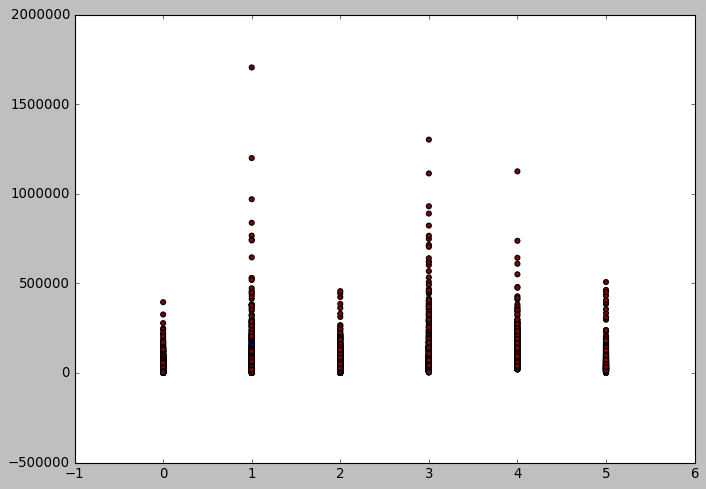

In [236]:
plt.figure(figsize=(10, 7))  
plt.scatter(airline['clust'],airline['Balance'], c=dbscan.labels_) 

In [240]:
sklearn.metrics.silhouette_score(df_norm, y_kmeans)

0.4103819713307722

In [ ]:
******************************************************************************************************************************

In [ ]:
********************************************************************************************************************************

In [ ]:
#DBScan

In [34]:
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler

In [36]:
airline

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award?
0,28143,0,1,1,1,174,1,0,0,7000,0
1,19244,0,1,1,1,215,2,0,0,6968,0
2,41354,0,1,1,1,4123,4,0,0,7034,0
3,14776,0,1,1,1,500,1,0,0,6952,0
4,97752,0,4,1,1,43300,26,2077,4,6935,1
...,...,...,...,...,...,...,...,...,...,...,...
3994,18476,0,1,1,1,8525,4,200,1,1403,1
3995,64385,0,1,1,1,981,5,0,0,1395,1
3996,73597,0,3,1,1,25447,8,0,0,1402,1
3997,54899,0,1,1,1,500,1,500,1,1401,0


In [37]:
airline.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3999 entries, 0 to 3998
Data columns (total 11 columns):
 #   Column             Non-Null Count  Dtype
---  ------             --------------  -----
 0   Balance            3999 non-null   int64
 1   Qual_miles         3999 non-null   int64
 2   cc1_miles          3999 non-null   int64
 3   cc2_miles          3999 non-null   int64
 4   cc3_miles          3999 non-null   int64
 5   Bonus_miles        3999 non-null   int64
 6   Bonus_trans        3999 non-null   int64
 7   Flight_miles_12mo  3999 non-null   int64
 8   Flight_trans_12    3999 non-null   int64
 9   Days_since_enroll  3999 non-null   int64
 10  Award?             3999 non-null   int64
dtypes: int64(11)
memory usage: 343.8 KB


In [38]:
array=airline.values
array

array([[28143,     0,     1, ...,     0,  7000,     0],
       [19244,     0,     1, ...,     0,  6968,     0],
       [41354,     0,     1, ...,     0,  7034,     0],
       ...,
       [73597,     0,     3, ...,     0,  1402,     1],
       [54899,     0,     1, ...,     1,  1401,     0],
       [ 3016,     0,     1, ...,     0,  1398,     0]], dtype=int64)

In [39]:
stscaler = StandardScaler().fit(array)
X = stscaler.transform(array) 
X 

array([[-4.51140783e-01, -1.86298687e-01, -7.69578406e-01, ...,
        -3.62167870e-01,  1.39545434e+00, -7.66919299e-01],
       [-5.39456874e-01, -1.86298687e-01, -7.69578406e-01, ...,
        -3.62167870e-01,  1.37995704e+00, -7.66919299e-01],
       [-3.20031232e-01, -1.86298687e-01, -7.69578406e-01, ...,
        -3.62167870e-01,  1.41192021e+00, -7.66919299e-01],
       ...,
       [-4.29480975e-05, -1.86298687e-01,  6.83121167e-01, ...,
        -3.62167870e-01, -1.31560393e+00,  1.30391816e+00],
       [-1.85606976e-01, -1.86298687e-01, -7.69578406e-01, ...,
        -9.85033311e-02, -1.31608822e+00, -7.66919299e-01],
       [-7.00507951e-01, -1.86298687e-01, -7.69578406e-01, ...,
        -3.62167870e-01, -1.31754109e+00, -7.66919299e-01]])

In [150]:
dbscan = DBSCAN(eps=10, min_samples=13)
dbscan.fit(X)   

DBSCAN(eps=10, min_samples=13)

In [151]:
dbscan.labels_ 

array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

In [152]:
cl=pd.DataFrame(dbscan.labels_,columns=['cluster']) 

In [153]:
cl
pd.set_option("display.max_rows", None)
cl

,cluster
0,0
1,0
2,0
3,0
4,0
5,0
6,0
7,0
8,0
9,0


In [156]:
airline1 = pd.concat([airline,cl],axis=1)
airline1

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award?,cluster
0,28143,0,1,1,1,174,1,0,0,7000,0,0
1,19244,0,1,1,1,215,2,0,0,6968,0,0
2,41354,0,1,1,1,4123,4,0,0,7034,0,0
3,14776,0,1,1,1,500,1,0,0,6952,0,0
4,97752,0,4,1,1,43300,26,2077,4,6935,1,0
5,16420,0,1,1,1,0,0,0,0,6942,0,0
6,84914,0,3,1,1,27482,25,0,0,6994,0,0
7,20856,0,1,1,1,5250,4,250,1,6938,1,0
8,443003,0,3,2,1,1753,43,3850,12,6948,1,0
9,104860,0,3,1,1,28426,28,1150,3,6931,1,0


In [157]:
import matplotlib.pyplot as plt
>>> plt.style.use('classic')

Text(0.5, 1.0, 'Clusters using DBScan')

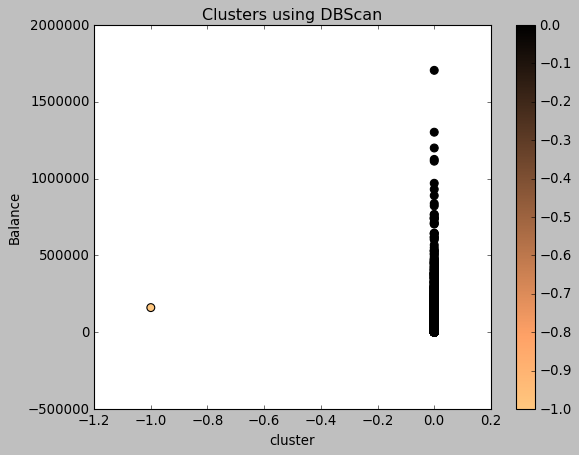

In [162]:
airline1.plot(x="cluster",y ="Balance",c=dbscan.labels_ ,kind="scatter",s=50 ,cmap=plt.cm.copper_r) 
plt.title('Clusters using DBScan') 

In [163]:
dl = dbscan.labels_

In [164]:
sklearn.metrics.silhouette_score(X, dl)

0.8562820070415407

In [ ]:
******************************************************************************************************************************

In [ ]:
******************************************************************************************************************************